In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler

import torchvision.datasets as dset
import torchvision.transforms as T

import numpy as np
import matplotlib.pyplot as plt

from utils.file import VideoFile
from utils.load import load_videos
from utils.ssim import ssim, msssim
import math

%load_ext autoreload
%autoreload 2

import multiprocessing
multiprocessing.set_start_method('spawn', force=True) # OpenCV in dataloader

import matplotlib.pyplot as plt
import gc

ToImage = T.ToPILImage()

https://stats.stackexchange.com/questions/219914/rnns-when-to-apply-bptt-and-or-update-weights/220111

https://pdfs.semanticscholar.org/9a98/4104e5d3ab9c9f5d27e50d99e5ea1fb25429.pdf - Convolutional LSTMs

https://github.com/pytorch/examples/tree/master/word_language_model - Pytorch LSTM example

https://arxiv.org/abs/1801.10308 - Nested LSTMs

http://cs231n.stanford.edu/reports/2017/pdfs/423.pdf - Previous 231

https://arxiv.org/pdf/1601.06759.pdf - PixelRNN

https://arxiv.org/pdf/1608.05148.pdf - Google Image Compression

https://arxiv.org/abs/1511.06085 - Baseline for previous paper

https://arxiv.org/abs/1512.03385 - Deep Residual Learning (ResNet)

https://arxiv.org/pdf/1708.00838v1.pdf - Image Compression layer on top of existing codecs

https://www.cv-foundation.org/openaccess/content_iccv_2015/papers/Tran_Learning_Spatiotemporal_Features_ICCV_2015_paper.pdf - 3D convolutions, suggests that transfer learning from single image stuff not so useful

https://arxiv.org/pdf/1805.12295.pdf - Newer google image compression, good references

https://arxiv.org/pdf/1804.09869.pdf - Video compression

Break training data into 30 frame chunks: chunks may be unnecessary variable lengths supported

30 Frame chunks: batch size 8ish (assuming 16 bit floats)

Nested LSTM?

LSTMCell

PixelCNN style context

In [2]:
#data_loader = load_videos("seqs/objective-2-slow/list.txt")
data_loader = load_videos("seqs/random/test.txt")
dtype = torch.cuda.FloatTensor 
#dtype = torch.FloatTensor
device = torch.device("cuda:0")

# Simple explicit state strategy

Train on reference images (not reconstructions), to allow parallelizing training.

In [3]:
prev_frames = 3
num_conv = 4

In [4]:
class Squeeze(nn.Module):
    def forward(self, x):
        return x.squeeze(dim=2)
    
class Debug(nn.Module):
    def forward(self, x):
        print("Debug ")
        print(x.shape)
        return x
    
class FullCompress(nn.Module):
    def __init__(self, predictor, autoencoder):
        super(FullCompress, self).__init__()
        self.predictor = predictor.eval()
        for p in self.predictor.parameters():
            p.requires_grad_(False)
        
        self.autoencoder = autoencoder
    def forward(self, ctx, truth):
        with torch.no_grad():
            pred = self.predictor(ctx)
            
        res = truth - pred 
        enc_res = self.autoencoder(res)

        return pred + enc_res
    
class ResBlock(nn.Module):
    def __init__(self, size):
        super(ResBlock, self).__init__()
        self.conv1 = nn.Conv2d(size, size, kernel_size=3, stride=1, padding=1)
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv2d(size, size, kernel_size=3, stride=1, padding=1)
        
    def forward(self, x):
        out = self.conv1(x)
        out = self.relu(out)
        out = self.conv2(out)
        out += x
        out = self.relu(out)
        
        return out
    
class ResBlock3d(nn.Module):
    def __init__(self, size):
        super(ResBlock3d, self).__init__()
        self.conv1 = nn.Conv3d(size, size, kernel_size=3, stride=1, padding=1)
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv3d(size, size, kernel_size=3, stride=1, padding=1)
        
    def forward(self, x):
        out = self.conv1(x)
        out = self.relu(out)
        out = self.conv2(out)
        out += x
        out = self.relu(out)
        
        return out

In [5]:
pred_model = nn.Sequential(
    nn.Conv3d(3, 32, kernel_size=3, stride=1, padding=1),
    #nn.BatchNorm3d(32),
    nn.ReLU(),
    ResBlock3d(32),
    nn.Conv3d(32, 64, kernel_size=3, stride=(1, 3, 3), padding=(1, 0, 0)), # Reduce to 32x32
    #nn.BatchNorm3d(64),
    nn.ReLU(),
    nn.Conv3d(64, 64, kernel_size=3, stride=1, padding=(0, 1, 1)), # Reduce time dimension
    Squeeze(),
    #nn.BatchNorm2d(64),
    nn.ReLU(),
    ResBlock(64),
    nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1),
).type(dtype)
"""
layers = []
prev_channels = 3
for i in range(num_conv):
    layers.append(nn.Conv3d(prev_channels, 32, (3, 3, 3), stride=1, padding=(1, 1, 1)))
    layers.append(nn.ReLU())
    layers.append(nn.BatchNorm3d(32))
    prev_channels = 32
    
layers.append(nn.Conv3d(prev_channels, 16, (3, 1, 1), stride=1, padding=(0, 0, 0))) # Reduce time dimension to one
layers.append(Squeeze())
layers.append(nn.ReLU())
layers.append(nn.BatchNorm2d(16))
layers.append(nn.Conv2d(16, 3, 3, stride=1, padding=(1, 1)))
layers.append(nn.ReLU())
layers.append(nn.BatchNorm2d(3))
layers.append(nn.Conv2d(3, 3, 7, stride=3, padding=2))
    

pred_model = nn.Sequential(*layers).type(dtype)
"""

'\nlayers = []\nprev_channels = 3\nfor i in range(num_conv):\n    layers.append(nn.Conv3d(prev_channels, 32, (3, 3, 3), stride=1, padding=(1, 1, 1)))\n    layers.append(nn.ReLU())\n    layers.append(nn.BatchNorm3d(32))\n    prev_channels = 32\n    \nlayers.append(nn.Conv3d(prev_channels, 16, (3, 1, 1), stride=1, padding=(0, 0, 0))) # Reduce time dimension to one\nlayers.append(Squeeze())\nlayers.append(nn.ReLU())\nlayers.append(nn.BatchNorm2d(16))\nlayers.append(nn.Conv2d(16, 3, 3, stride=1, padding=(1, 1)))\nlayers.append(nn.ReLU())\nlayers.append(nn.BatchNorm2d(3))\nlayers.append(nn.Conv2d(3, 3, 7, stride=3, padding=2))\n    \n\npred_model = nn.Sequential(*layers).type(dtype)\n'

In [6]:
class Quantize(nn.Module):
    def forward(self, x):
        shape = x.shape
        flat = x.view(-1)
        flat = flat.type(torch.cuda.ByteTensor)
        flat = flat / 32
        self.compressed = flat
        flat = flat * 32
        flat = flat.type(dtype)
        flat = flat.view(*shape)
        return flat

In [7]:
enc_model = nn.Sequential(
    nn.Conv2d(3, 64, 3, stride=1, padding=1),
    nn.ReLU(),
    ResBlock(64),
    nn.Conv2d(64, 64, 4, stride=2, padding=1),
    nn.ReLU(),
    #nn.BatchNorm2d(64),
    nn.Conv2d(64, 64, 8, stride=6, padding=2),
    nn.ReLU(),
    nn.Conv2d(64, 64, 2, stride=1, padding=0),
    nn.ReLU(),
    #nn.BatchNorm2d(64),
    nn.Conv2d(64, 4, 1, stride=1, padding=0),
    nn.ReLU(),
    #nn.BatchNorm2d(8),
#    Quantize(),
    nn.ConvTranspose2d(4, 64, 1, stride=1, padding=0),
    nn.ReLU(),
    nn.ConvTranspose2d(64, 64, 2, stride=1, padding=0),
    nn.ReLU(),
    #nn.BatchNorm2d(64),
    nn.ConvTranspose2d(64, 64, 8, stride=6, padding=2),
    nn.ReLU(),
    #nn.BatchNorm2d(64),
    nn.ConvTranspose2d(64, 64, 4, stride=2, padding=1),
    nn.ReLU(),
    ResBlock(64),
    nn.ConvTranspose2d(64, 3, 3, stride=1, padding=1)
).type(dtype)

In [8]:
model = FullCompress(pred_model, enc_model)

In [9]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Conv3d):
        nn.init.xavier_normal_(m.weight.data)

model.load_state_dict(torch.load("model_backctx"), strict=False)
model.autoencoder.apply(weights_init)
#model.load_state_dict(torch.load("model_backctx_auto"))

#model.load_state_dict(torch.load("model"))

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU()
  (2): ResBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (3): Conv2d(64, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (4): ReLU()
  (5): Conv2d(64, 64, kernel_size=(8, 8), stride=(6, 6), padding=(2, 2))
  (6): ReLU()
  (7): Conv2d(64, 64, kernel_size=(2, 2), stride=(1, 1))
  (8): ReLU()
  (9): Conv2d(64, 4, kernel_size=(1, 1), stride=(1, 1))
  (10): ReLU()
  (11): ConvTranspose2d(4, 64, kernel_size=(1, 1), stride=(1, 1))
  (12): ReLU()
  (13): ConvTranspose2d(64, 64, kernel_size=(2, 2), stride=(1, 1))
  (14): ReLU()
  (15): ConvTranspose2d(64, 64, kernel_size=(8, 8), stride=(6, 6), padding=(2, 2))
  (16): ReLU()
  (17): ConvTranspose2d(64, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (18): ReLU()
  (19): ResBlock(
    (conv1)

In [10]:
def neg_ssim(img1, img2):
    #return -1.0*ssim(img1, img2)[0]
    return -1.0*msssim(img1, img2)
calc_loss = neg_ssim
#calc_loss = nn.MSELoss()

def evaluate(model, solver, data, truth):
    result = model(data, truth[:, :, 32:64, 32:64])
    
    # Fill in prediction to the current frame's context
    # Calculates loss on 64x64 area
    big_result = truth[:, :, :, :].clone()
    big_result[:, :, 32:64, 32:64] = result
    
    loss = calc_loss(big_result, truth)
    if math.isnan(loss):
        solver.zero_grad()
        return loss
    
    solver.zero_grad()
    loss.backward()
    solver.step()
    
    return loss

In [11]:
ctx_sz = 96

def train_on_frame_chunks(solver, model, video, chunks_tall, chunks_wide, num_frames):
    for i in range(prev_frames, prev_frames+num_frames):
        subset = video[i - prev_frames:i + 1].transpose(0, 1)#.to(device).type(dtype)
        chunks = subset.view(subset.shape[0], subset.shape[1], chunks_tall, ctx_sz, chunks_wide, ctx_sz)
            
        chunks = chunks.permute(2, 4, 0, 1, 3, 5).clone().view(-1, 3, prev_frames + 1, ctx_sz, ctx_sz)
        truths = chunks[:, :, prev_frames, :, :]

        chunks = chunks[:, :, 0:prev_frames, :, :]

        for data, truth in zip(chunks.split(64, 0), truths.split(64, 0)):
            data = data.type(dtype).to(device)
            truth = truth.type(dtype).to(device)
            loss = evaluate(model, solver, data, truth)
        
    print("Loss {}".format(loss))
        
def train_on_video(solver, model, video):
    num_frames = video.shape[0]
    video = F.pad(video, (0, 0, 0, 0, 0, 0, prev_frames, 0))
    
    # Display first frame of video
    img = video[3].cpu()
    plt.imshow(ToImage(img))
    plt.show()
    
    num_ctx_tall = video.shape[2] // ctx_sz
    num_ctx_wide = video.shape[3] // ctx_sz
    video_sub = video[:, :, 0:num_ctx_tall*ctx_sz, 0:num_ctx_wide*ctx_sz]
    train_on_frame_chunks(solver, model, video_sub, num_ctx_tall, num_ctx_wide, num_frames)
    
    num_ctx_tall = (video.shape[2] - 32) // ctx_sz
    num_ctx_wide = (video.shape[3] - 32) // ctx_sz
    video_sub = video[:, :, 32:32+num_ctx_tall*ctx_sz, 32:32+num_ctx_wide*ctx_sz]
    train_on_frame_chunks(solver, model, video_sub, num_ctx_tall, num_ctx_wide, num_frames)
    
    num_ctx_tall = (video.shape[2] - 64) // ctx_sz
    num_ctx_wide = (video.shape[3] - 64) // ctx_sz
    video_sub = video[:, :, 64:64+num_ctx_tall*ctx_sz, 64:64+num_ctx_wide*ctx_sz]
    train_on_frame_chunks(solver, model, video_sub, num_ctx_tall, num_ctx_wide, num_frames)

In [12]:
def train(model, video_set, lr, num_epochs):
    for epoch in range(num_epochs):
        #solver = optim.Adam(model.parameters(), lr=lr, betas=(0.5, 0.999), weight_decay=1e-8)
        solver = optim.Adam(model.autoencoder.parameters(), lr=lr, betas=(0.5, 0.999), weight_decay=1e-5)
        #lr /= 2
        for videos in video_set:
            gc.collect()
            lr = 0.9*lr
            for i in range(len(videos)):
                video = videos[i]
                train_on_video(solver, model, video)
        

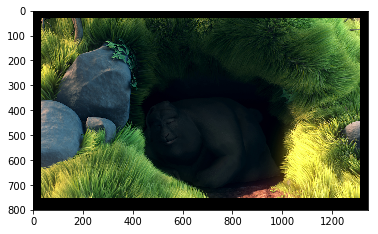

Loss -0.8833683133125305
Loss -0.923315703868866
Loss -0.9352351427078247


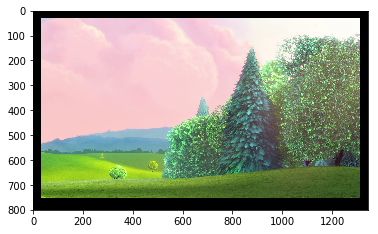

Loss -0.8971883654594421
Loss -0.9134276509284973
Loss -0.9087826013565063


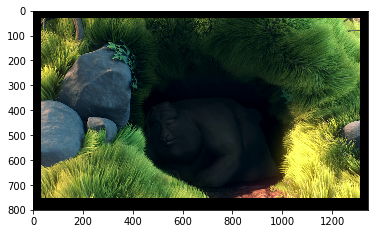

Loss -0.9397926926612854
Loss -0.9297723174095154
Loss -0.9506635665893555


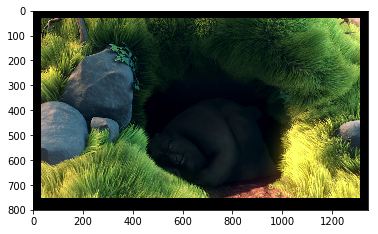

Loss -0.9427860379219055
Loss -0.9398847222328186
Loss -0.9504062533378601


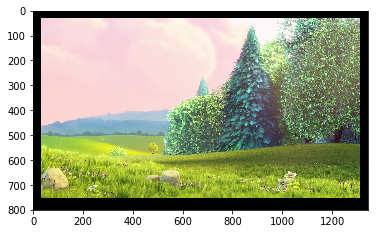

Loss -0.9001303911209106
Loss -0.9173658490180969
Loss -0.9223001003265381


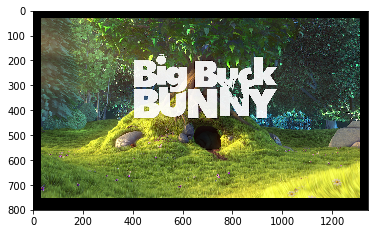

Loss -0.9327917695045471
Loss -0.9496869444847107
Loss -0.942682147026062


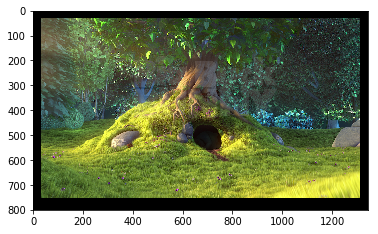

Loss -0.9368932247161865
Loss -0.9489112496376038
Loss -0.9452239871025085


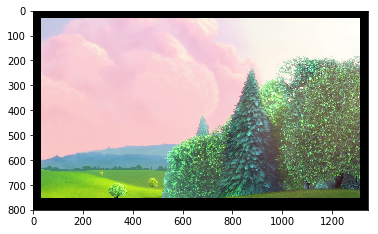

Loss -0.9176812767982483
Loss -0.9049272537231445
Loss -0.9209433197975159


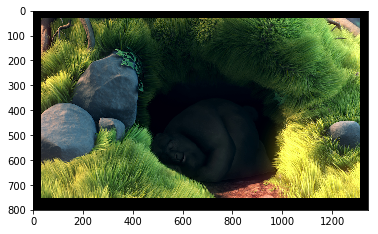

Loss -0.9443874359130859
Loss -0.9475529789924622
Loss -0.9488590359687805


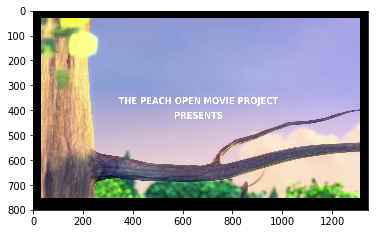

Loss -0.9303409457206726
Loss -0.9476332068443298
Loss -0.9453628659248352


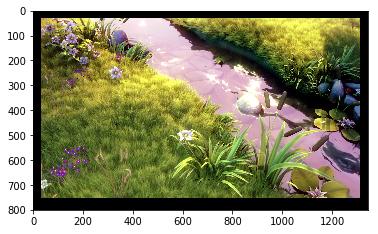

Loss -0.9490407705307007
Loss -0.9464027881622314
Loss -0.9398737549781799


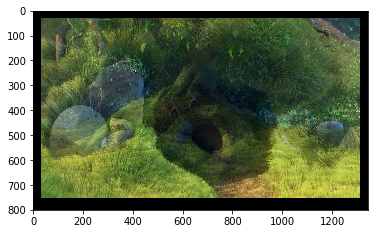

Loss -0.9328793883323669
Loss -0.9442885518074036
Loss -0.9491488933563232


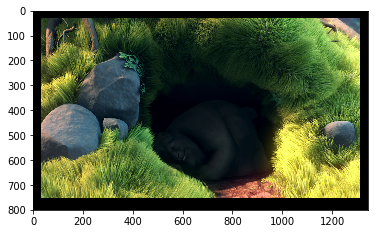

Loss -0.9453012347221375
Loss -0.9456292986869812
Loss -0.9493115544319153


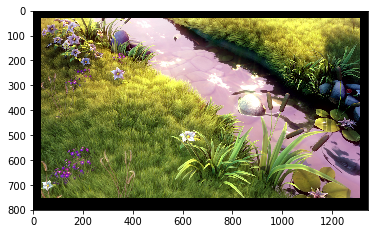

Loss -0.9392855167388916
Loss -0.9468100070953369
Loss -0.9438804388046265


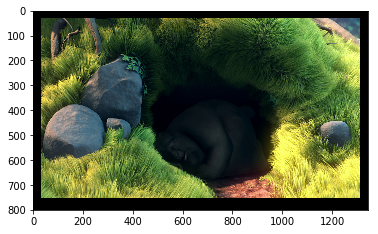

Loss -0.9462469816207886
Loss -0.9520126581192017
Loss -0.9491755962371826


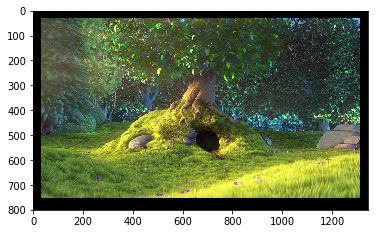

Loss -0.9386553168296814
Loss -0.9502712488174438
Loss -0.9486095905303955


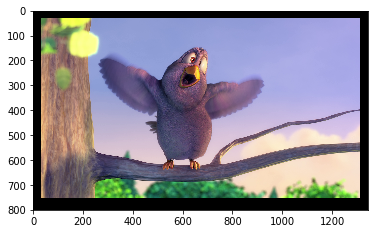

Loss -0.9572358727455139
Loss -0.9592188000679016
Loss -0.9505892395973206


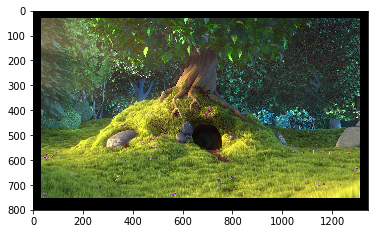

Loss -0.9518221616744995
Loss -0.9621005058288574
Loss -0.9552856683731079


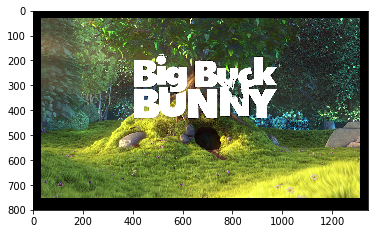

Loss -0.9422655701637268
Loss -0.9547489285469055
Loss -0.9461684226989746


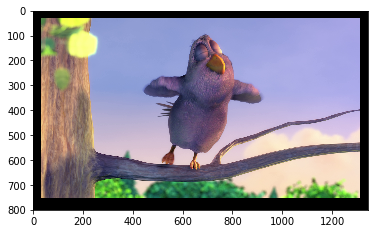

Loss -0.9555119872093201
Loss -0.9631953239440918
Loss -0.96054607629776


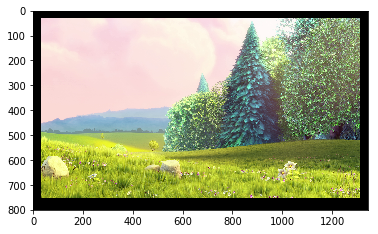

Loss -0.9386430978775024
Loss -0.9473482370376587
Loss -0.9439738988876343


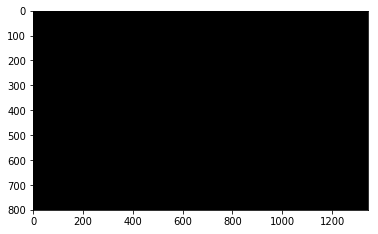

Loss -0.9805577397346497
Loss -0.9711624383926392
Loss -0.9814632534980774


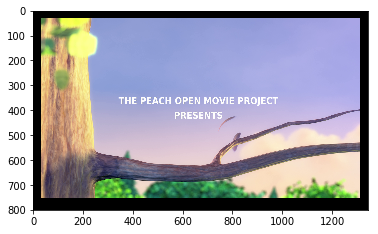

Loss -0.9577692151069641
Loss -0.9598778486251831
Loss -0.9592064619064331


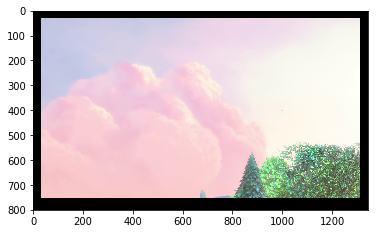

Loss -0.9545658826828003
Loss -0.9572182893753052
Loss -0.949655294418335


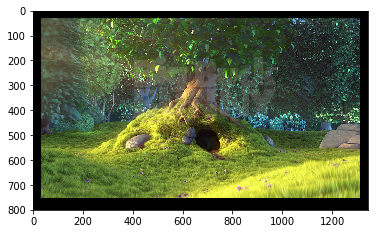

Loss -0.936302661895752
Loss -0.9490687847137451
Loss -0.9457013010978699


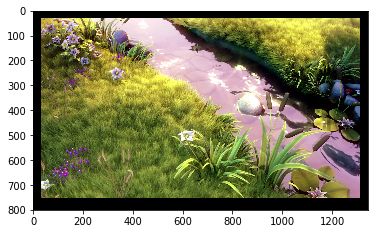

Loss -0.9379404187202454
Loss -0.9496866464614868
Loss -0.9384317398071289


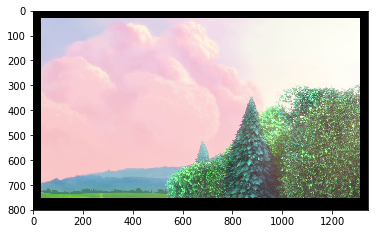

Loss -0.9156004786491394
Loss -0.9144058227539062
Loss -0.9066010117530823


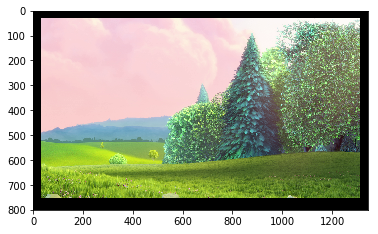

Loss -0.9086026549339294
Loss -0.9268485307693481
Loss -0.9243090152740479


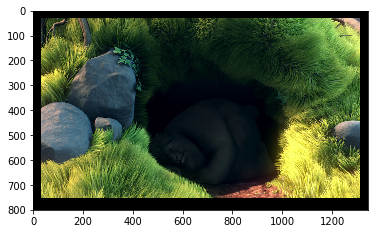

Loss -0.9455209970474243
Loss -0.9557142853736877
Loss -0.953088641166687


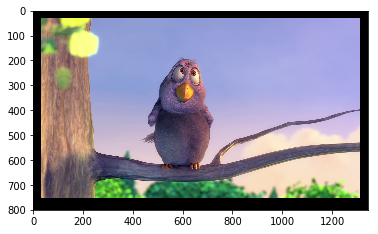

Loss -0.9516319632530212
Loss -0.9585379958152771
Loss -0.9527134299278259


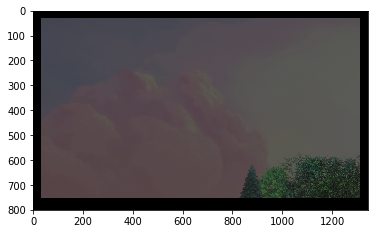

Loss -0.9658495783805847
Loss -0.9717195630073547
Loss -0.9649226665496826


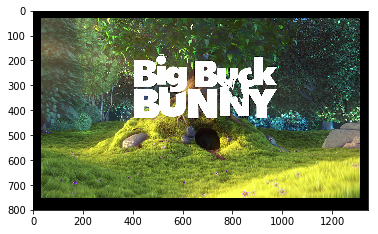

Loss -0.9396960735321045
Loss -0.9552628397941589
Loss -0.947035014629364


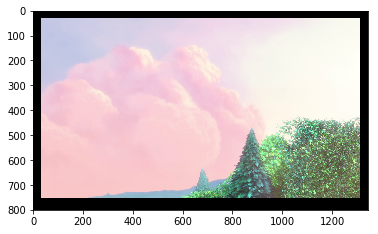

Loss -0.9333398342132568
Loss -0.9476563930511475
Loss -0.9318031668663025


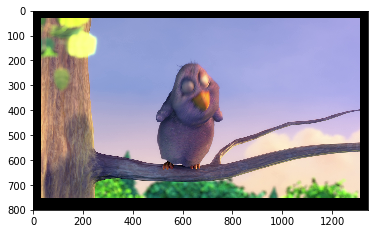

Loss -0.9587521553039551
Loss -0.9667646288871765
Loss -0.9588451385498047


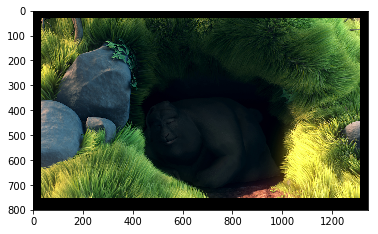

Loss -0.9530513286590576
Loss -0.9662549495697021
Loss -0.9618683457374573


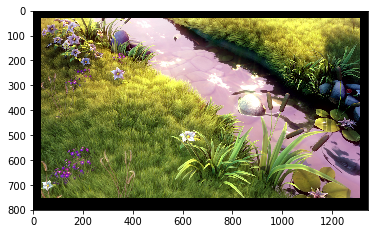

Loss -0.941818118095398
Loss -0.9541740417480469
Loss -0.9451743960380554


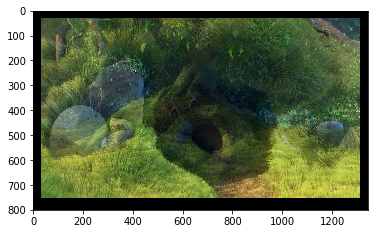

Loss -0.9455282688140869
Loss -0.9588335156440735
Loss -0.9507538080215454


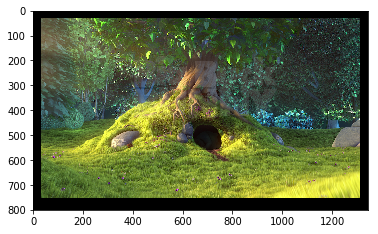

Loss -0.9423850178718567
Loss -0.955200731754303
Loss -0.9480482935905457


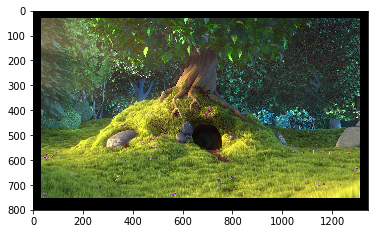

Loss -0.9537000060081482
Loss -0.9642684459686279
Loss -0.9547613859176636


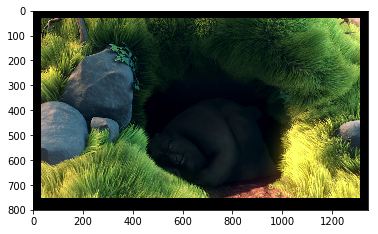

Loss -0.9538487195968628
Loss -0.9667192697525024
Loss -0.9618851542472839


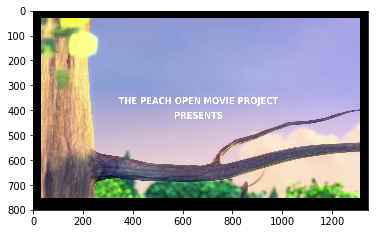

Loss -0.9380059838294983
Loss -0.9533489942550659
Loss -0.9470444321632385


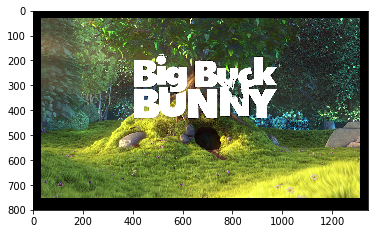

Loss -0.9411631226539612
Loss -0.9558084011077881
Loss -0.9457095861434937


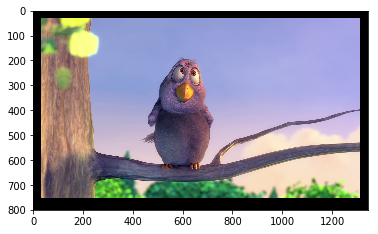

Loss -0.9570022821426392
Loss -0.9660559296607971
Loss -0.9656046628952026


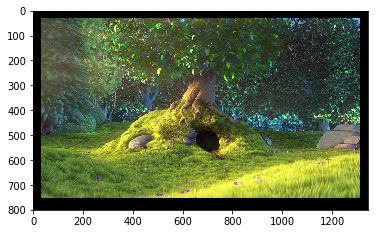

Loss -0.9401340484619141
Loss -0.956759512424469
Loss -0.9490881562232971


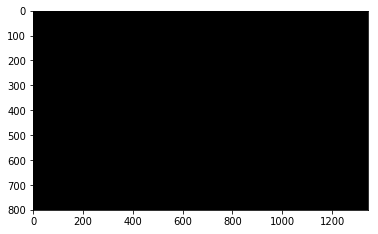

Loss -0.9800907373428345
Loss -0.9835410714149475
Loss -0.9830114245414734


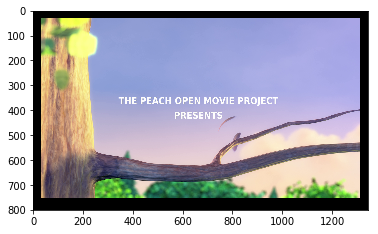

Loss -0.9634296298027039
Loss -0.9714649319648743
Loss -0.9698586463928223


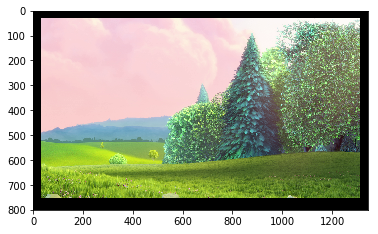

Loss -0.9199040532112122
Loss -0.9403932094573975
Loss -0.9406731128692627


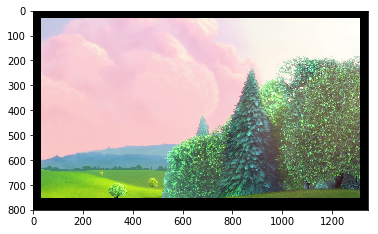

Loss -0.93655925989151
Loss -0.9481920599937439
Loss -0.9398505091667175


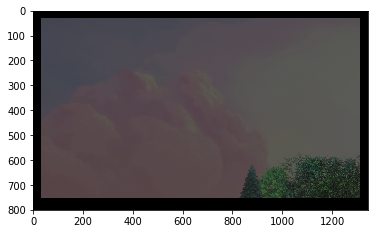

Loss -0.9697127938270569
Loss -0.9759730696678162
Loss -0.9670833349227905


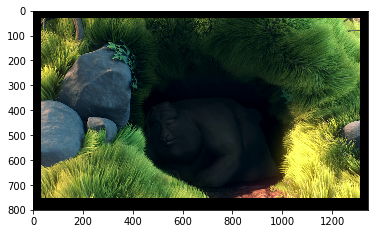

Loss -0.9529160857200623
Loss -0.9670745134353638
Loss -0.9631556868553162


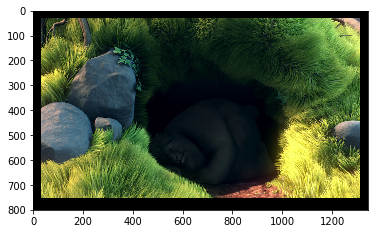

Loss -0.9546800851821899
Loss -0.9640223383903503
Loss -0.9569997787475586


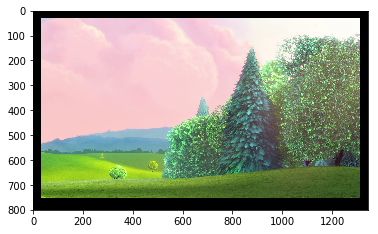

Loss -0.939121663570404
Loss -0.9521371722221375
Loss -0.9397631287574768


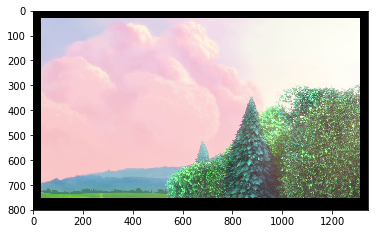

Loss -0.935687780380249
Loss -0.9457500576972961
Loss -0.9332089424133301


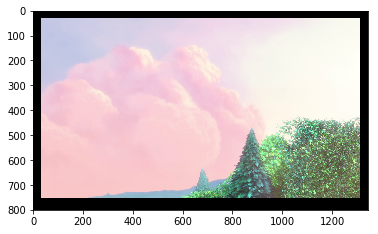

Loss -0.9454655051231384
Loss -0.9574795365333557
Loss -0.9466753005981445


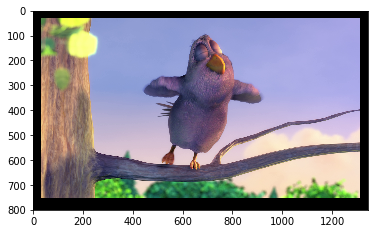

Loss -0.9605270624160767
Loss -0.9695894718170166
Loss -0.9695016145706177


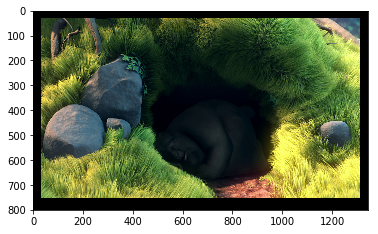

Loss -0.9473623037338257
Loss -0.960668683052063
Loss -0.9517003893852234


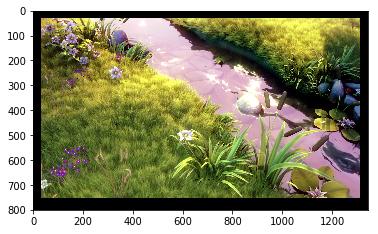

Loss -0.9612957239151001
Loss -0.968460202217102
Loss -0.9651803374290466


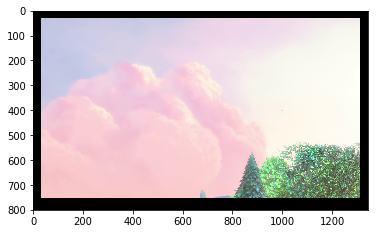

Loss -0.9602525234222412
Loss -0.9670941233634949
Loss -0.9556705951690674


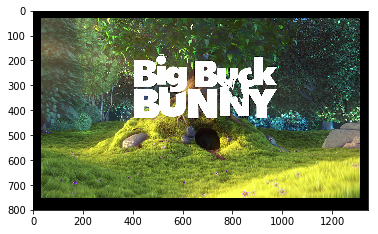

Loss -0.9447559714317322
Loss -0.9564818739891052
Loss -0.9483214020729065


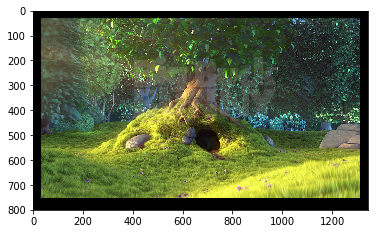

Loss -0.9448270797729492
Loss -0.9571021795272827
Loss -0.9492748379707336


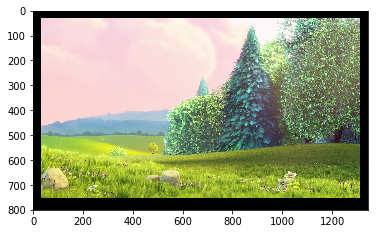

Loss -0.9294785857200623
Loss -0.9477854371070862
Loss -0.9395853281021118


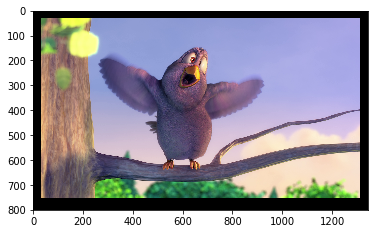

Loss -0.9667249321937561
Loss -0.9713544249534607
Loss -0.9715209603309631


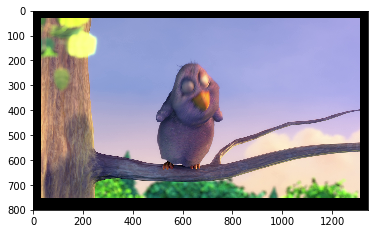

Loss -0.9689218401908875
Loss -0.9723854660987854
Loss -0.9716218709945679


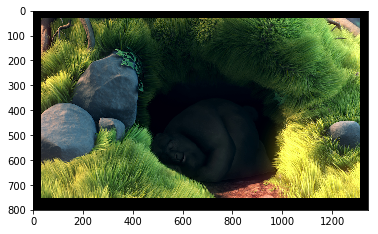

Loss -0.9525651335716248
Loss -0.9612340927124023
Loss -0.9507646560668945


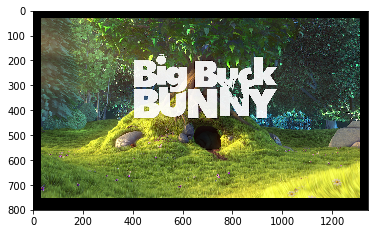

Loss -0.9449265599250793
Loss -0.9571827054023743
Loss -0.946436882019043


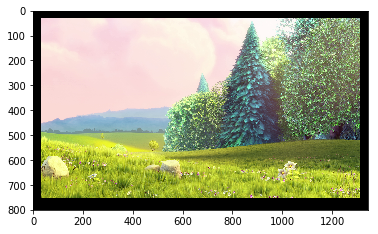

Loss -0.94123774766922
Loss -0.9532880783081055
Loss -0.9422668814659119


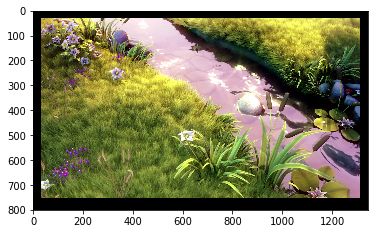

Loss -0.9452179670333862
Loss -0.9589239358901978
Loss -0.9477858543395996


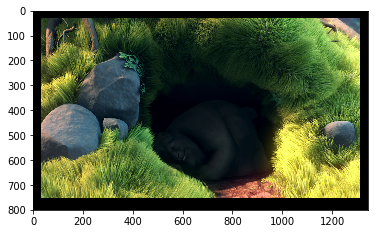

Loss -0.9518912434577942
Loss -0.9596472382545471
Loss -0.9527199268341064


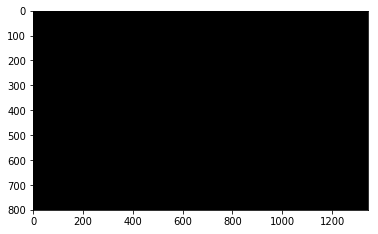

Loss -0.9822392463684082
Loss -0.988781213760376
Loss -0.9838842153549194


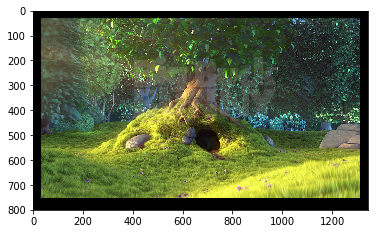

Loss -0.9446287155151367
Loss -0.9570648074150085
Loss -0.948062539100647


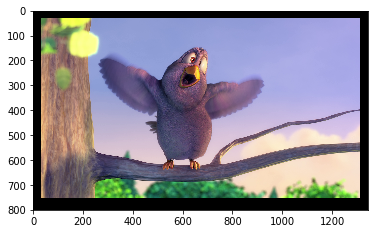

Loss -0.9659373760223389
Loss -0.9721850156784058
Loss -0.9709078073501587


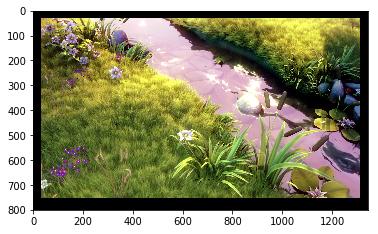

Loss -0.9635577201843262
Loss -0.9688606858253479
Loss -0.966945469379425


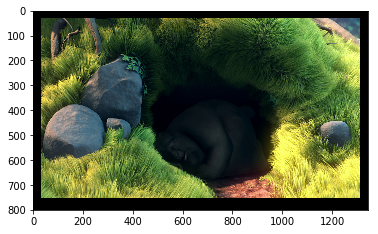

Loss -0.947586178779602
Loss -0.9620347023010254
Loss -0.9506991505622864


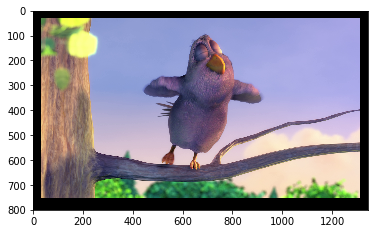

Loss -0.9656869769096375
Loss -0.9714600443840027
Loss -0.972282886505127


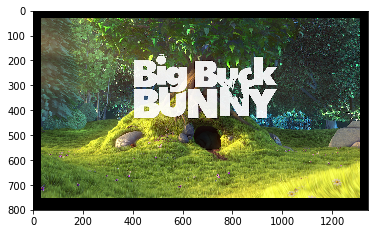

Loss -0.9441729784011841
Loss -0.9567058086395264
Loss -0.9450791478157043


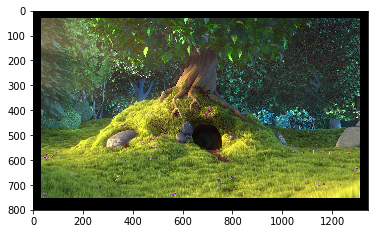

Loss -0.9517760872840881
Loss -0.9653877019882202
Loss -0.951209545135498


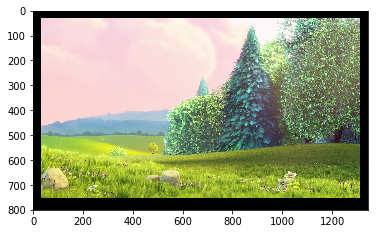

Loss -0.9356355667114258
Loss -0.9485452175140381
Loss -0.9388030767440796


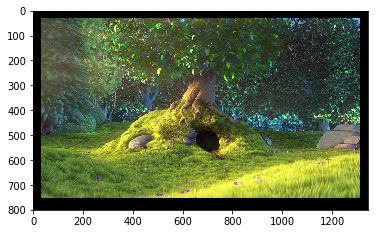

Loss -0.94318026304245
Loss -0.9555822014808655
Loss -0.9456011056900024


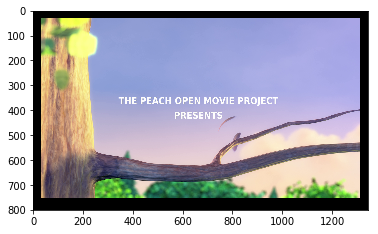

Loss -0.9698570966720581
Loss -0.9745646715164185
Loss -0.9739736914634705


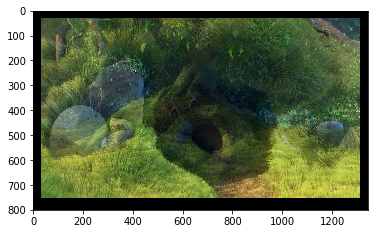

Loss -0.9492026567459106
Loss -0.9619178771972656
Loss -0.9494741559028625


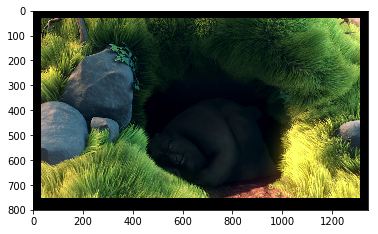

Loss -0.9553346037864685
Loss -0.9660399556159973
Loss -0.9588465094566345


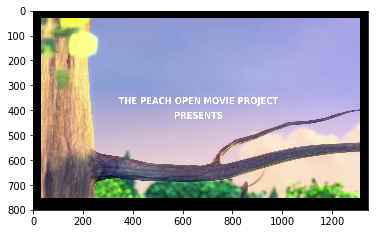

Loss -0.9420058727264404
Loss -0.9563654065132141
Loss -0.9497404098510742


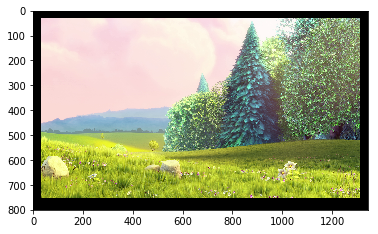

Loss -0.9414329528808594
Loss -0.952370285987854


KeyboardInterrupt: 

In [13]:
train(model, data_loader, 1e-3, 20)

In [14]:
model.zero_grad()
torch.save(model.state_dict(), "model_backctx_auto_less")

In [15]:
model.load_state_dict(torch.load("model_backctx_auto_less"))
model = model.eval()

In [ ]:
def test(model, video):
    print(video.shape)
    residuals = []
    num_frames = video.shape[0]
    height = video.shape[2]
    width = video.shape[3]
    num_chunks_tall = height // 32
    num_chunks_wide = width // 32
    ctx = torch.zeros(1, 3, prev_frames, height, width).type(dtype)
    for f in range(num_frames):
        print("Frame {}".format(f))
        pred_frame = torch.zeros(3, height, width).type(dtype)
        res_frame = torch.zeros(3, height, width).type(dtype)
        for i in range(num_chunks_tall - 2):
            for j in range(num_chunks_wide - 2):
                sub_ctx = ctx[:, :, :, i*32:i*32+96, j*32:j*32+96]
                truth = video[f, :, i*32+32:i*32+64, j*32+32:j*32+64].type(dtype)
                truth = truth.view(1, *truth.shape)
                pred = model(sub_ctx, truth)
                
                res = truth[0] - pred[0]
                pred_frame[:, i*32+32:i*32+64, j*32+32:j*32+64] = pred[0]
                res_frame[:, i*32+32:i*32+64, j*32+32:j*32+64] = res
                #sub_ctx[0, :, 2, 32:64, 32:64] = truth
                
        plt.imshow(ToImage(video[f]))
        plt.show()
        plt.imshow(ToImage(pred_frame.cpu()))
        plt.show()
        res_frame = -1.0*torch.max(torch.abs(res_frame), 0, keepdim=True)[0]
        print(res_frame.shape)
        plt.imshow(ToImage(res_frame.cpu()))
        plt.set_cmap('Greys')
        plt.show()
        #plt.imshow(ToImage(ctx[0, :, 2, :, :].cpu()))
        #plt.show()
                
        ctx[:, :, 0, :, :] = ctx[:, :, 1, :, :]
        ctx[:, :, 1, :, :] = ctx[:, :, 2, :, :]
        
        #ctx[0, :, 2, :, :] = pred_frame[:, :, :]
        ctx[0, :, 2, :, :] = video[f, :, :, :]

In [ ]:
test_loader = load_videos("seqs/random/trunc.txt", 100)
test_video = next(iter(test_loader))[0]

with torch.no_grad():
    test(model, test_video)